# Image Filtering: Spatial vs Frequency Domain — Hands-on Notebook

This notebook contains theory and runnable code examples for:
- Noise models (Gaussian, Salt & Pepper)
- Spatial-domain filters: median, Gaussian (manual + OpenCV), bilateral
- Frequency-domain filtering using FFT (Gaussian LPF/HPF)

Run the cells in order. Change parameters in the **Try-it** cells to explore.

In [1]:
# Basic imports
import numpy as np
import matplotlib.pyplot as plt
import cv2
from scipy.ndimage import convolve
from scipy.signal import medfilt2d
import os
from PIL import Image

from numpy.fft import fft2, ifft2, fftshift
import cv2
import time


In [2]:
# Helper functions: load image, noise addition, metrics, kernels

def load_gray_image(path, target_size=None):
    if path is None or not isinstance(path, str):
        raise ValueError("A valid image path (string) must be provided.")
    im = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if im is None:
        raise FileNotFoundError(f"Image not found at path: {path}")
    print("Original shape:", im.shape)
    if target_size is not None:
        im = cv2.resize(im, (target_size[1], target_size[0]), interpolation=cv2.INTER_AREA)
        print("Resized shape:", im.shape)

    return im.astype(np.float32) / 255.0

def add_gaussian_noise(image, mean=0.0, var=0.2):
    sigma = np.sqrt(var)
    gauss = np.random.normal(mean, sigma, image.shape).astype(np.float32)
    noisy = image + gauss
    return np.clip(noisy, 0.0, 1.0)

def add_salt_pepper_noise(image, salt_prob=0.01, pepper_prob=0.01):
    noisy = image.copy()
    # Salt
    num_salt = np.ceil(salt_prob * image.size).astype(int)
    coords = (np.random.randint(0, i, num_salt) for i in image.shape)
    noisy[tuple(coords)] = 1.0
    # Pepper
    num_pepper = np.ceil(pepper_prob * image.size).astype(int)
    coords = (np.random.randint(0, i, num_pepper) for i in image.shape)
    noisy[tuple(coords)] = 0.0
    return noisy

def gaussian_kernel(size, sigma=1.0):
    ax = np.arange(-size//2 + 1., size//2 + 1.)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-(xx**2 + yy**2) / (2. * sigma**2))
    kernel = kernel / np.sum(kernel)
    return kernel


## 1) Noise models

We will demonstrate two common noise models:

- **Gaussian noise**: additive zero-mean Gaussian with variance $\sigma^2$.
- **Salt & Pepper noise**: random pixels set to 0 (pepper) or 1 (salt).

Change the variance and observe how filtering performance changes.

Original shape: (256, 256)


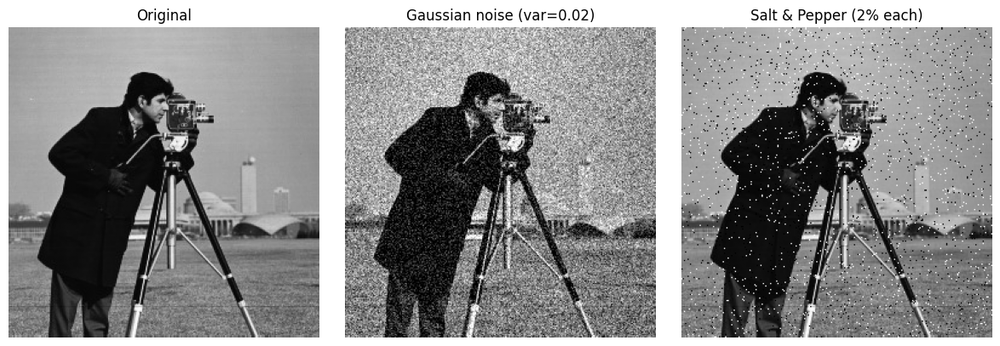

In [3]:
# Load image and show noisy versions
img = load_gray_image("cameraman.jpeg")
np.random.seed(0)

img_gauss = add_gaussian_noise(img, var=0.02)
img_sp = add_salt_pepper_noise(img, salt_prob=0.02, pepper_prob=0.02)

plt.figure(figsize=(12,4))
plt.subplot(1,3,1); plt.imshow(img, cmap='gray'); plt.title('Original'); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(img_gauss, cmap='gray'); plt.title('Gaussian noise (var=0.02)'); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(img_sp, cmap='gray'); plt.title('Salt & Pepper (2% each)'); plt.axis('off')
plt.tight_layout()
plt.show()

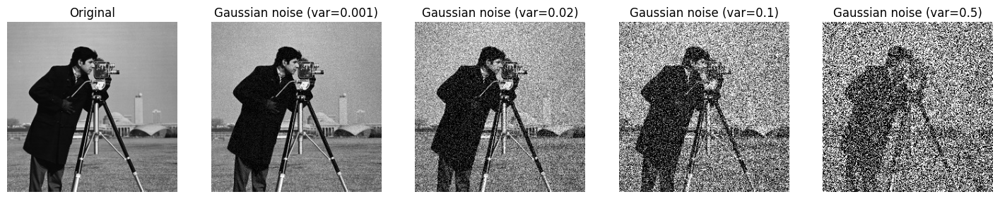

In [4]:
img_gauss_smallest = add_gaussian_noise(img, var=0.001)
img_gauss_small = add_gaussian_noise(img, var = 0.02)
img_gauss_med = add_gaussian_noise(img, var = 0.1)
img_gauss_large = add_gaussian_noise(img, var = 0.5)

plt.figure(figsize=(18, 12))
plt.subplot(1,5,1); plt.imshow(img, cmap='gray'); plt.title('Original'); plt.axis('off')
plt.subplot(1,5,2); plt.imshow(img_gauss_smallest, cmap='gray'); plt.title('Gaussian noise (var=0.001)'); plt.axis('off')
plt.subplot(1,5,3); plt.imshow(img_gauss_small, cmap='gray'); plt.title('Gaussian noise (var=0.02)'); plt.axis('off')
plt.subplot(1,5,4); plt.imshow(img_gauss_med, cmap='gray'); plt.title('Gaussian noise (var=0.1)'); plt.axis('off')
plt.subplot(1,5,5); plt.imshow(img_gauss_large, cmap='gray'); plt.title('Gaussian noise (var=0.5)'); plt.axis('off')
plt.show()

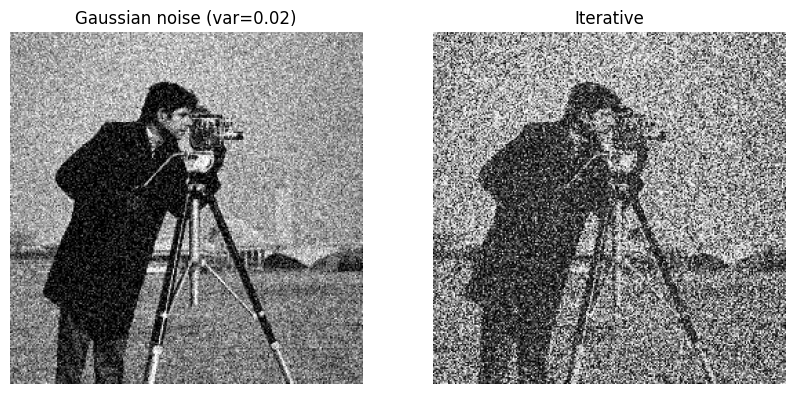

In [5]:
n = 100
img_gauss_n = np.copy(img)
for i in range(n):
    img_gauss_n = add_gaussian_noise(img_gauss_n, var = 0.001)

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(img_gauss_small, cmap='gray'); plt.title('Gaussian noise (var=0.02)'); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(img_gauss_n, cmap = 'gray'); plt.title('Iterative'); plt.axis('off')
plt.show()

## 2) Spatial-domain filters

**Box Filter**: Kernel has all values as the same

**Gaussian filter** (linear): convolution with a Gaussian kernel; good for smoothing Gaussian noise. Kernel equation:

$$
G(x,y) = \frac{1}{2\pi\sigma^2} e^{-\frac{x^2+y^2}{2\sigma^2}}
$$

**Bilateral filter**: edge-preserving filter that weights both spatial distance and intensity difference.

### Bilateral Filter

The bilateral filter computes the output intensity at a pixel $p$ as:

$$
I_{out}(p) = \frac{1}{W_p} \sum_{q \in \Omega} I(q) \;
\exp\left(-\frac{\|p-q\|^2}{2\sigma_s^2}\right) \;
\exp\left(-\frac{(I(p)-I(q))^2}{2\sigma_r^2}\right)
$$

where:

- $I(p)$ : intensity at pixel $p$  
- $\Omega$ : neighborhood around $p$  
- $\sigma_s$ : spatial smoothing parameter (`sigmaSpace`)  
- $\sigma_r$ : range smoothing parameter (`sigmaColor`)  
- $W_p$ : normalization term, given by  

$$
W_p = \sum_{q \in \Omega}
\exp\left(-\frac{\|p-q\|^2}{2\sigma_s^2}\right) \;
\exp\left(-\frac{(I(p)-I(q))^2}{2\sigma_r^2}\right)
$$


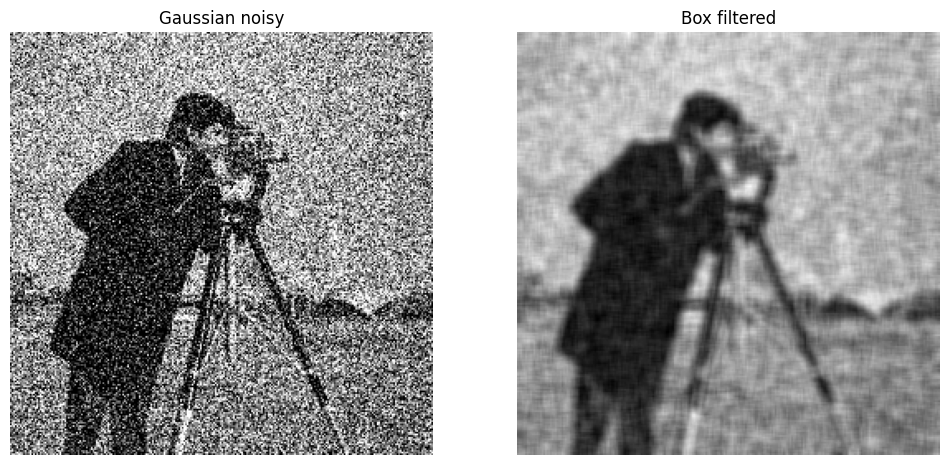

In [6]:
# Box Filter
N = 7
kern = np.ones((N, N)) / (N*N)
box_from_manual = convolve(img_gauss_med, kern, mode='reflect')

# Show
plt.figure(figsize=(12,6))
plt.subplot(1,2,1); plt.imshow(img_gauss_med, cmap='gray'); plt.title('Gaussian noisy'); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(box_from_manual, cmap='gray'); plt.title('Box filtered'); plt.axis('off')
plt.show()

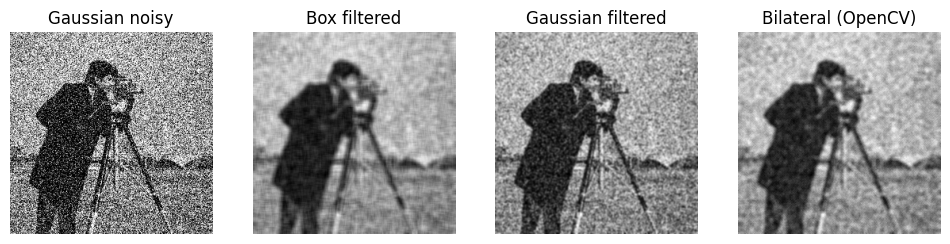

In [7]:
# Gaussian filter manual (convolution)
kern = gaussian_kernel(7, sigma=1)
gauss_from_manual = convolve(img_gauss_med, kern, mode='reflect')
# Bilateral filter (OpenCV) on u8
bilat = cv2.bilateralFilter(img_gauss_med, d=7, sigmaColor=75, sigmaSpace=75).astype(np.float32)/255.0

# Show
plt.figure(figsize=(12,6))
plt.subplot(1,4,1); plt.imshow(img_gauss_med, cmap='gray'); plt.title('Gaussian noisy'); plt.axis('off')
plt.subplot(1,4,2); plt.imshow(box_from_manual, cmap='gray'); plt.title('Box filtered'); plt.axis('off')
plt.subplot(1,4,3); plt.imshow(gauss_from_manual, cmap='gray'); plt.title('Gaussian filtered'); plt.axis('off')
plt.subplot(1,4,4); plt.imshow(bilat, cmap='gray'); plt.title('Bilateral (OpenCV)'); plt.axis('off')
plt.show()

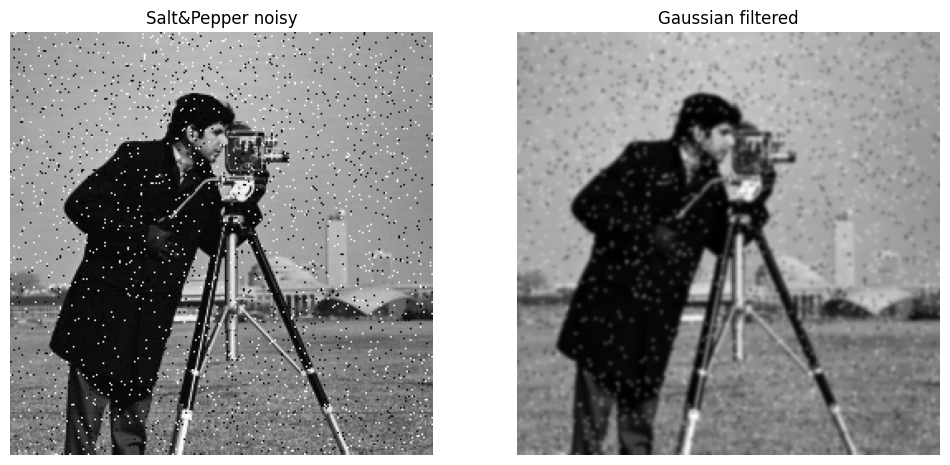

In [8]:
gauss_sp = convolve(img_sp, kern, mode='reflect')

plt.figure(figsize=(12,6))
plt.subplot(1,2,1); plt.imshow(img_sp, cmap='gray'); plt.title('Salt&Pepper noisy'); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(gauss_sp, cmap='gray'); plt.title('Gaussian filtered'); plt.axis('off')
plt.show()

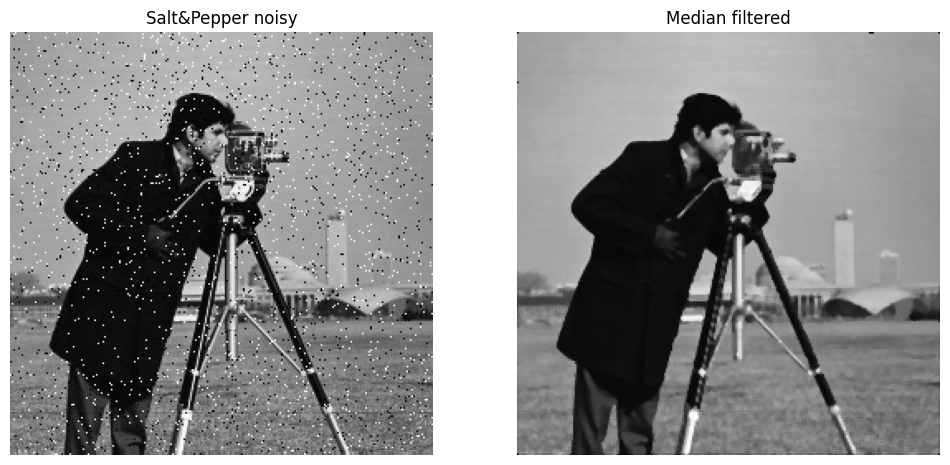

In [9]:
med_sp = medfilt2d(img_sp, kernel_size=3)

plt.figure(figsize=(12,6))
plt.subplot(1,2,1); plt.imshow(img_sp, cmap='gray'); plt.title('Salt&Pepper noisy'); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(med_sp, cmap='gray'); plt.title('Median filtered'); plt.axis('off')
plt.show()

Manual Median Filter Time: 1.1934 s
SciPy medfilt2d Time: 0.0108 s
Max Pixel Difference: 0.615686297416687


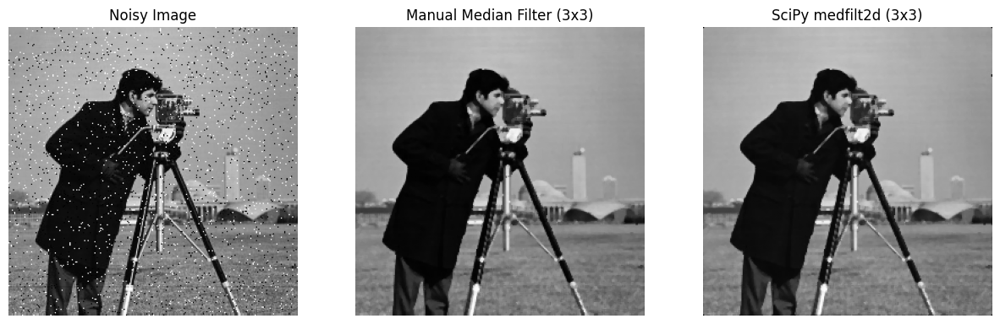

In [10]:

noisy_img = add_salt_pepper_noise(img, salt_prob=0.02, pepper_prob=0.02)
# -------------------- Manual Median Filter --------------------
def manual_median_filter(image, kernel_size=3):
  # write your code here
    pad = kernel_size // 2
    padded = np.pad(image, pad, mode='edge')
    output = np.zeros_like(image)

    H, W = image.shape
    for i in range(H):
        for j in range(W):
            window = padded[i:i+3,j:j+3]
            output[i, j] = np.median(window)
    return output

# -------------------- Compare Speed --------------------
ksize = 3

# Manual filter
t1 = time.time()
manual_filtered = manual_median_filter(noisy_img, kernel_size=ksize)
t2 = time.time()

# Built-in medfilt2d
t3 = time.time()
scipy_filtered = medfilt2d(noisy_img, kernel_size=ksize)
t4 = time.time()

print(f"Manual Median Filter Time: {(t2 - t1):.4f} s")
print(f"SciPy medfilt2d Time: {(t4 - t3):.4f} s")
print(f"Max Pixel Difference: {np.abs(manual_filtered - scipy_filtered).max()}")

# -------------------- Plot Results --------------------
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(noisy_img, cmap='gray')
axs[0].set_title("Noisy Image")
axs[0].axis("off")

axs[1].imshow(manual_filtered, cmap='gray')
axs[1].set_title(f"Manual Median Filter ({ksize}x{ksize})")
axs[1].axis("off")

axs[2].imshow(scipy_filtered, cmap='gray')
axs[2].set_title(f"SciPy medfilt2d ({ksize}x{ksize})")
axs[2].axis("off")

plt.show()


## 3) Frequency-domain filtering (FFT)

Fourier transform (2D discrete):

$$
F(u,v) = \sum_{x=0}^{M-1} \sum_{y=0}^{N-1} f(x,y) e^{-j 2\pi (ux/M + vy/N)}
$$

We will build Gaussian low-pass and high-pass filters in the frequency domain. Steps:
1. Compute FFT of image
2. Shift zero-frequency to center (fftshift)
3. Multiply spectrum by filter mask
4. Inverse shift and inverse FFT



In [11]:
# Function to compute FFT and return fshift + magnitude spectrum
def compute_fft(img):
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = np.log(np.abs(fshift) + 1)
    return fshift, magnitude_spectrum

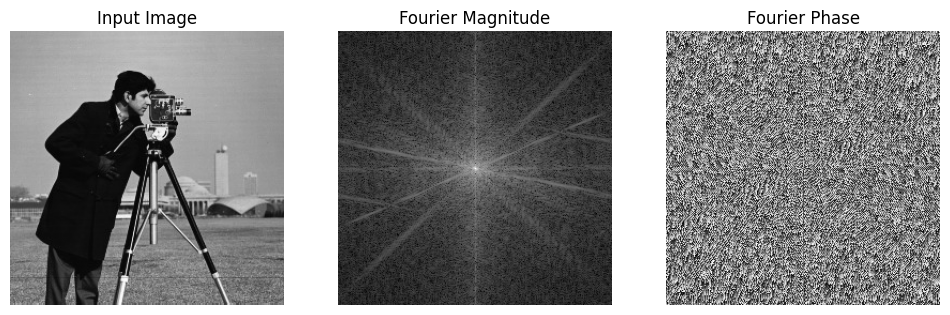

In [12]:
def plot_fourier(img):
    fshift_img, mag_img = compute_fft(img)
    phase = np.angle(fshift_img)
    plt.figure(figsize=(12, 6))
    plt.subplot(1,3,1)
    plt.imshow(img, cmap='gray', vmin = 0, vmax = 1)
    plt.title("Input Image")
    plt.axis('off')

    plt.subplot(1,3,2)
    plt.imshow(mag_img, cmap = 'gray')
    plt.title("Fourier Magnitude")
    plt.axis('off')

    plt.subplot(1,3,3)
    plt.imshow(phase, cmap="gray")
    plt.title("Fourier Phase")
    plt.axis('off')


plot_fourier(img)


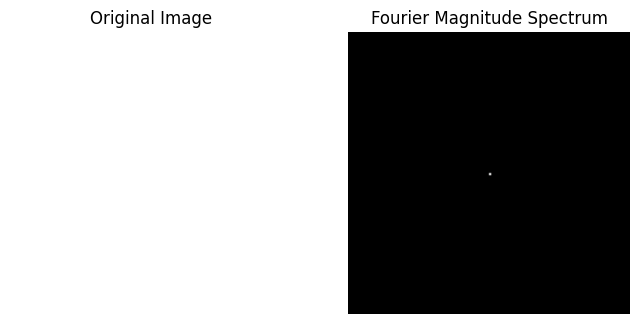

In [13]:
def save_and_plot_fft(img, img_name="image", spectrum_name="spectrum"):
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = np.log1p(np.abs(fshift))  # log scaling

    plt.imsave(f"{img_name}.png", img, cmap="gray", vmin=0, vmax=1)

    plt.imsave(f"{spectrum_name}.png", magnitude_spectrum, cmap="gray")

    plt.figure(figsize=(8,4))

    plt.subplot(1,2,1)
    plt.imshow(img, cmap="gray", vmin=0, vmax=1)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(magnitude_spectrum, cmap="gray")
    plt.title("Fourier Magnitude Spectrum")
    plt.axis("off")

    plt.show()

solid_image = np.ones(shape = (128, 128))
save_and_plot_fft(solid_image, "solid", "solid_spectrum")

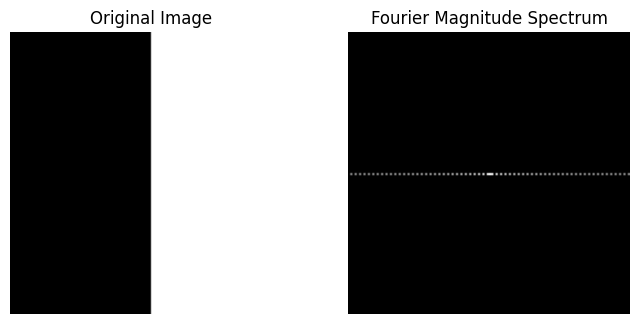

In [14]:
def step_edge_x(height=128, width=128):
    img = np.zeros((height, width))
    img[:, width//2:] = 1   # right half white
    return img

def step_edge_y(height=128, width=128):
    img = np.zeros((height, width))
    img[height//2:, :] = 1  # bottom half white
    return img
img_x = step_edge_x()
img_y = step_edge_y()
save_and_plot_fft(img_x, "stepx", "stepy_spectrum")

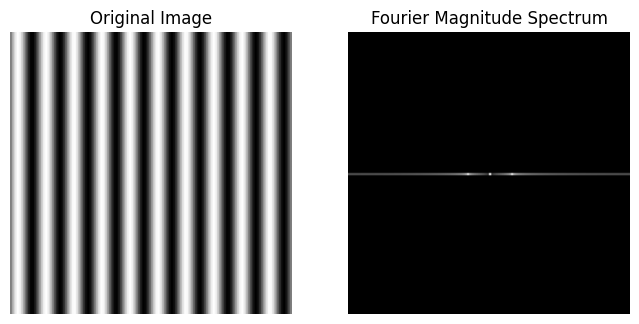

In [15]:
def sinusoidal_images(size=128, freq=5):
    x = np.linspace(0, 2*np.pi, size)
    y = np.linspace(0, 2*np.pi, size)
    xx, yy = np.meshgrid(x, y)

    # Sinusoid varying in x-direction (vertical stripes)
    x_sin = 0.5 * (1 + np.sin(freq * xx))  # normalize to [0,1]

    # Sinusoid varying in y-direction (horizontal stripes)
    y_sin = 0.5 * (1 + np.sin(freq * yy))  # normalize to [0,1]

    return x_sin, y_sin

# Example usage
xsin_img, ysin_img = sinusoidal_images(size=128, freq=10)
save_and_plot_fft(xsin_img, "sinx", "sinx_spectrum")

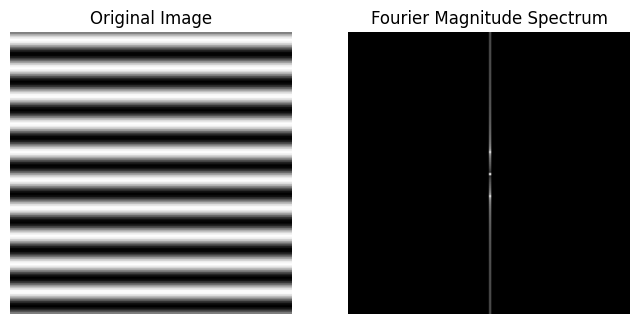

In [16]:
save_and_plot_fft(ysin_img, "siny", "siny_spectrum")

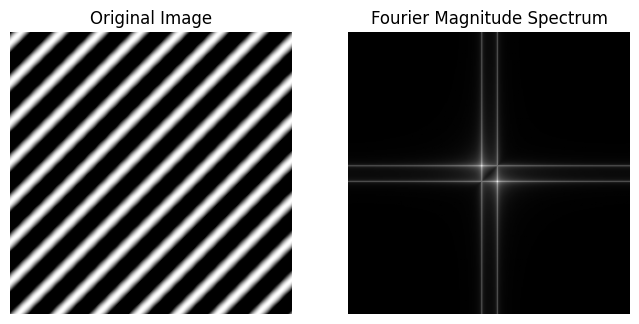

In [17]:
def generate_45deg_sinusoid(size=256, frequency=10):
    x = np.arange(size)
    y = np.arange(size)
    X, Y = np.meshgrid(x, y)

    coord = (X + Y) / np.sqrt(2)

    sinusoid = np.sin(2 * np.pi * frequency * coord / size)

    return sinusoid

# Example usage
sin45_img = generate_45deg_sinusoid(size=256, frequency=10)
save_and_plot_fft(sin45_img, "sin45", "sin45_spectrum")


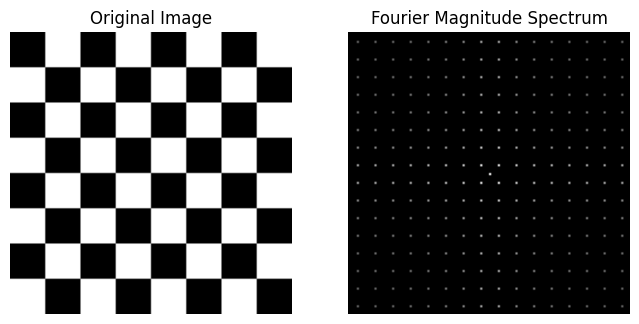

In [18]:

def generate_chessboard(size=256, num_squares=8):
    # Pixel grid
    x = np.arange(size)
    y = np.arange(size)
    X, Y = np.meshgrid(x, y)

    # Size of each square
    square_size = size // num_squares

    # Alternating pattern using integer division
    board = ((X // square_size) + (Y // square_size)) % 2

    return board

# Example usage
chessboard_img = generate_chessboard(size=128, num_squares=8)
save_and_plot_fft(chessboard_img, "chessboard", "chessboard_spectrum")

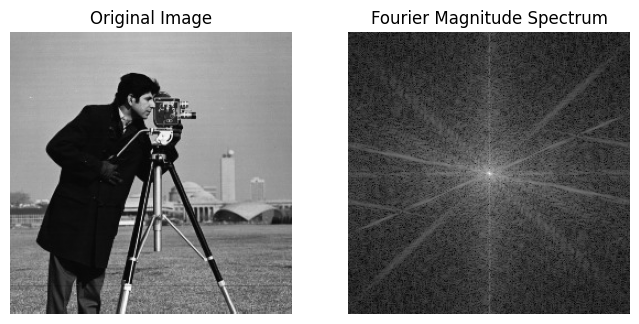

In [19]:
save_and_plot_fft(img, "cameraman", "cameraman_spectrum")

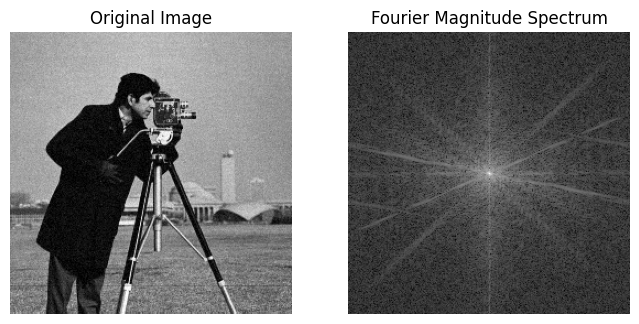

In [20]:
save_and_plot_fft(img_gauss_smallest, "camgauss", "camgauss_spectrum")

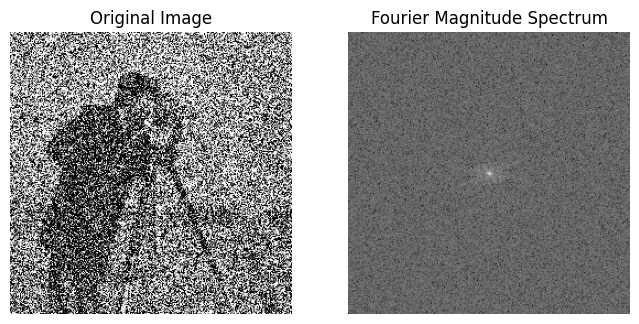

In [21]:
save_and_plot_fft(img_gauss_large, "camgauss", "camgauss_spectrum")

In [22]:
pad_kern = np.zeros_like(img, dtype=np.float32)
kern = gaussian_kernel(5, sigma=1)
kh, kw = kern.shape
r, c = img.shape

# # Compute starting indices for centering
start_x = (r - kh) // 2
start_y = (c - kw) // 2
plt.imsave("gauss_small.png", kern, cmap="gray")
pad_kern[start_x:start_x+kh, start_y:start_y+kw] = kern
# save_and_plot_fft(pad_kern, "gauss", "gauss_spectrum")

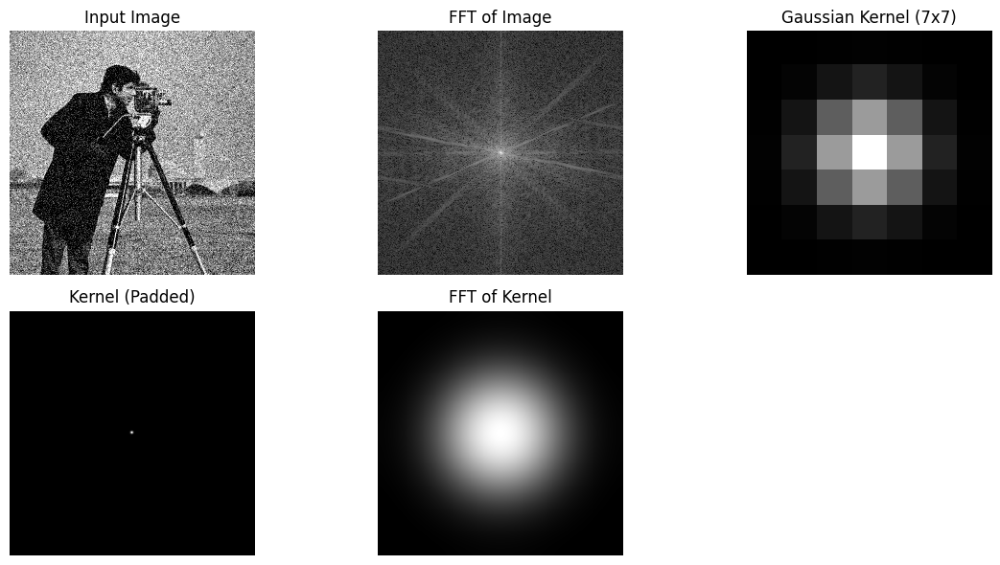

In [23]:
kern = gaussian_kernel(7, sigma=1)
# Pad kernel to match image size, centered
pad_kern = np.zeros_like(img, dtype=np.float32)
kh, kw = kern.shape
r, c = img.shape

# # Compute starting indices for centering
start_x = (r - kh) // 2
start_y = (c - kw) // 2

pad_kern[start_x:start_x+kh, start_y:start_y+kw] = kern


# Compute FFTs
fshift_img, mag_img = compute_fft(img_gauss_smallest)
fshift_kern, mag_kern = compute_fft(pad_kern)

# Plot results1
plt.figure(figsize=(12,6))
plt.subplot(2,3,1); plt.imshow(img_gauss, cmap='gray'); plt.title("Input Image"); plt.axis('off')
plt.subplot(2,3,2); plt.imshow(mag_img, cmap='gray'); plt.title("FFT of Image"); plt.axis('off')
plt.subplot(2,3,3);plt.imshow(kern, cmap='gray');plt.title("Gaussian Kernel (7x7)");plt.axis('off')
plt.subplot(2,3,4);plt.imshow(pad_kern, cmap='gray');plt.title("Kernel (Padded)");plt.axis('off')
plt.subplot(2,3,5);plt.imshow(mag_kern, cmap='gray');plt.title("FFT of Kernel");plt.axis('off')
plt.tight_layout()
plt.show()

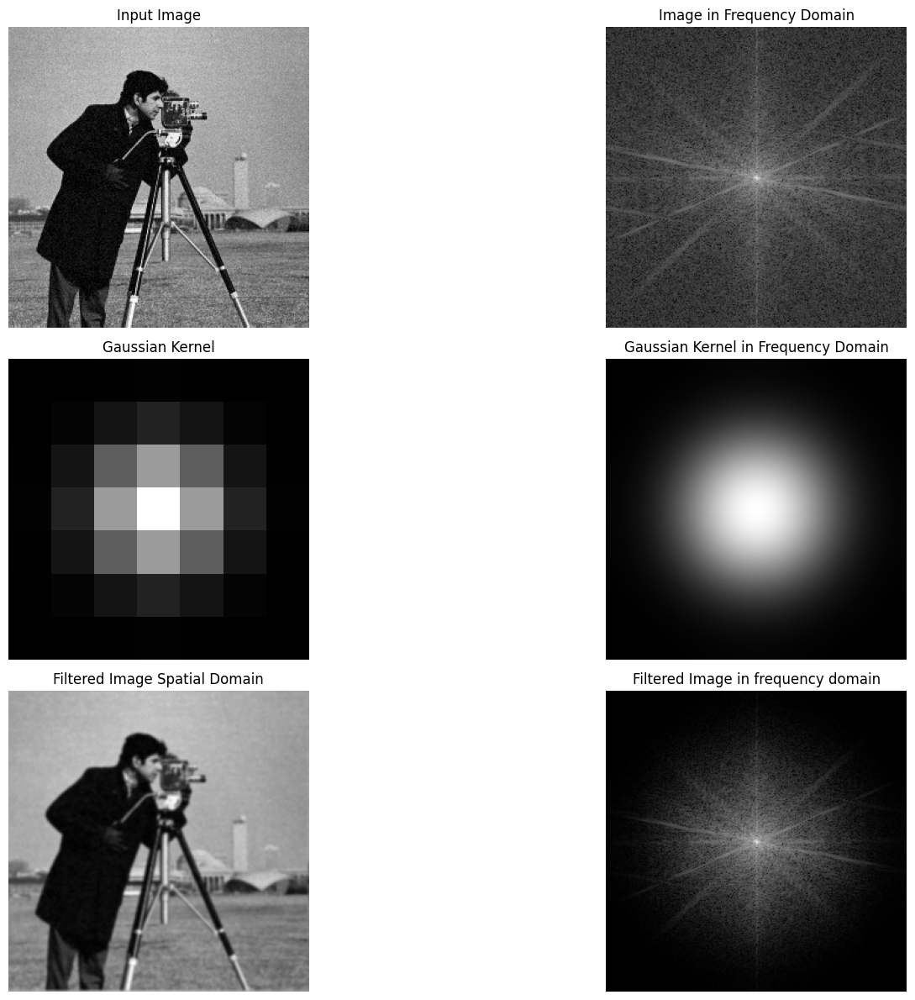

In [24]:
# Filtering in frequency domain
filtered_fft = fshift_img * fshift_kern
filtered_fft_mag = np.log(np.abs(filtered_fft) + 1)
filtered_img = np.fft.ifft2(np.fft.ifftshift(filtered_fft))
filtered_img = np.abs(fftshift(filtered_img))

# Show results
plt.figure(figsize=(18,12))
plt.subplot(3,2,1)
plt.imshow(img_gauss_smallest, cmap='gray')
plt.title("Input Image")
plt.axis('off')

plt.subplot(3,2,2)
plt.imshow(mag_img, cmap='gray')
plt.title("Image in Frequency Domain")
plt.axis('off')

plt.subplot(3,2,3)
plt.imshow(kern, cmap='gray')
plt.title("Gaussian Kernel")
plt.axis('off')

plt.subplot(3,2,4)
plt.imshow(mag_kern, cmap='gray')
plt.title("Gaussian Kernel in Frequency Domain")
plt.axis('off')


plt.subplot(3,2,5)
plt.imshow(filtered_img, cmap='gray')
plt.title("Filtered Image Spatial Domain")
plt.axis('off')

plt.subplot(3,2,6)
plt.imshow(filtered_fft_mag, cmap='gray')
plt.title("Filtered Image in frequency domain")
plt.axis('off')
plt.tight_layout()
plt.show()

plt.imsave("filtered_fft_mag.png", filtered_fft_mag, cmap="gray")
plt.imsave("filtered_img.png", filtered_img, cmap="gray")

## 4) Discussion & comparisons

- Median filtering is non-linear and cannot be represented simply as multiplication in the frequency domain.
- Bilateral filter is also non-linear and edge-preserving;

**Explain briefly from the formula of Bilateral Filtering, why Bilateral Filtering is non-linear**

##### Write Answer Here.
---
As the formula involved the exponential terms of spatial distance and intensity difference it is nonlinear


### Exercises (Try-it-yourself)

---

#### 1. Spatial vs Frequency Domain Filtering

- Perform **spatial-domain filtering (convolution)** on an image using:
  - Box (uniform) filter  
  - Gaussian filter  

- Perform the **same filtering via frequency-domain multiplication**:
  - Take the Fourier transform of the image and of the filter  
  - Multiply them  
  - Apply the inverse FFT  

- Compare:
  - Spatial vs frequency-domain results (visual comparison and quantitative metrics like **MSE** or **PSNR**)  
  - Does the Fourier-domain implementation reproduce spatial convolution exactly?  
  - Explain differences if any

- Plot:
  - Magnitude spectrum of the Fourier transform (log magnitude / dB) for **Box filter** and **Gaussian filter**  
  - Discuss which filter is “better” and why, based on their frequency response.  

- Apply both filters to several test images:
  - Include at least one image with strong **high-frequency content** (e.g., checkerboard, text).  
  - Discuss differences (edge blurring, ringing artifacts, texture preservation, etc.).  

---

#### 2. Fourier Transform of Simple and Real Images

- Take **5 images** of your choice:
  - **3 simple signals** (easy to compute Fourier transforms analytically)  
    - Examples: Rectangular box, Circular disk, Exponential decay, Circular ring, Single line, etc.  
  - **2 natural images** of your choice (e.g., low-light, noisy, rainy, etc.)  

- Tasks:
  - Compute and visualize their Fourier transforms.  
  - List observations about frequency content.  
  - (Tip: resize large images → Fourier transform is slow on large inputs).  

---

#### 3. Frequency-Domain High-Pass Filtering

- Implement a **frequency-domain high-pass filter** defined as:  

  $$
  H_{\text{high-pass}}(u,v) = 1 - H_{\text{low-pass}}(u,v)
  $$

- Use low-pass filters:
  - Gaussian  
  - Box blur  

- Apply the high-pass filter to an image.  
- Add the filtered result back to the original image to observe **edge enhancement**.  

---


#### 1. Spatial vs Frequency Domain Filtering


Original shape: (256, 256)


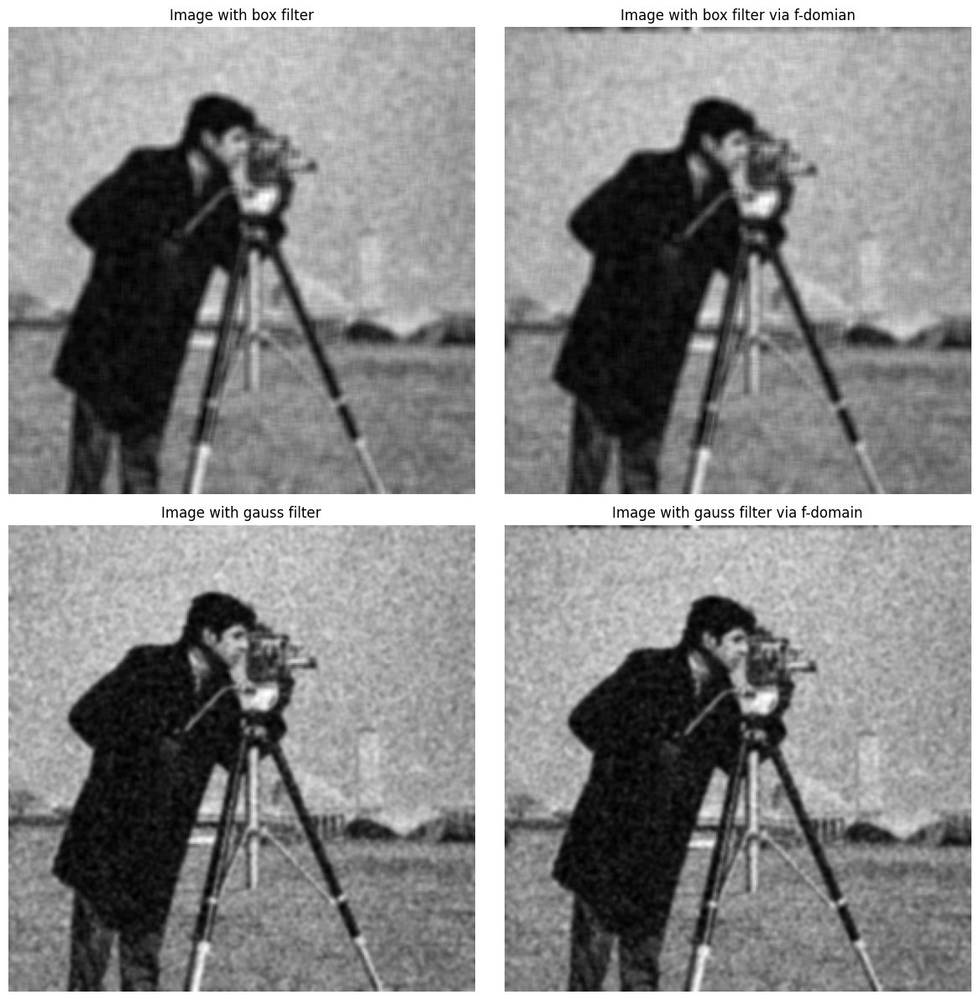

Box filter -> MSE: 0.005664085059227249, PSNR: 51.73609905184545
Gaussian filter -> MSE: 0.010344709498095538,  PSNR: 45.71280049561662
Yes, in theory: Multiplying in the Fourier domain is exactly equivalent to convolution in the spatial domain (by the convolution theorem). 
In practice, small differences may appear because of: Padding issues, Numerical precision etc. Which is present in this case.


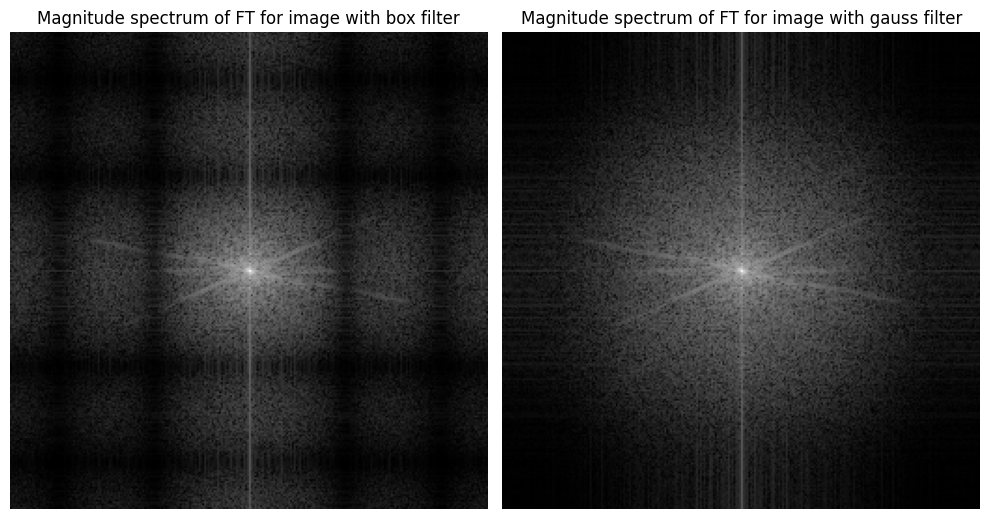

Box filter → abrupt low-pass, causes ripples/ringing.
Gaussian filter → smooth low-pass, avoids artifacts.
Original shape: (375, 500)
Original shape: (375, 500)


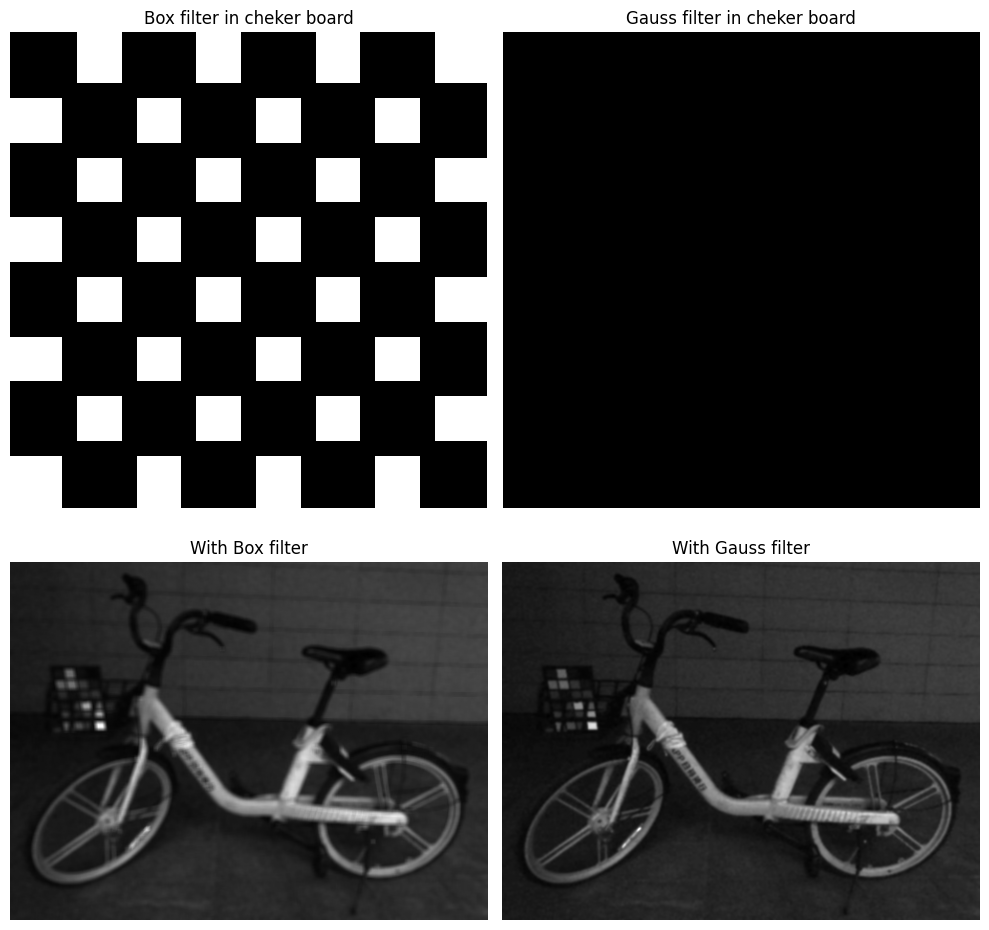

Original shape: (599, 602)
Original shape: (599, 602)


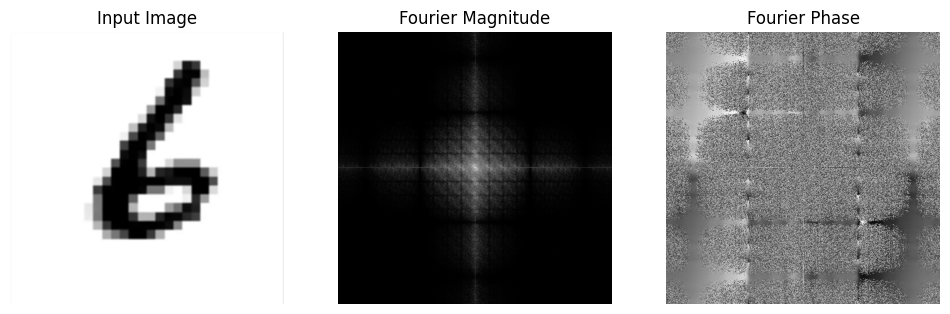

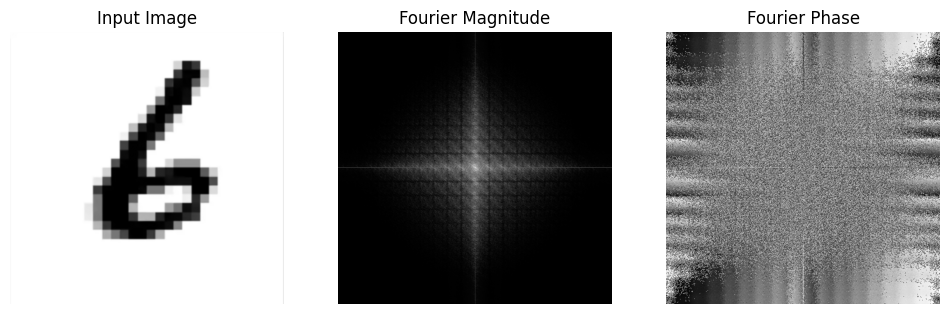

In [25]:
image=load_gray_image("cameraman.jpeg")
ksize=5

# image_gauss = image.copy()
image_gauss = add_gaussian_noise(image, var=0.02)
box_kernel = np.ones((ksize, ksize)) / (ksize **2)
gauss_kernel = gaussian_kernel(ksize)

# ---spatial-domain filtering (convolution) with box, gaussian filter---
image_with_box_kernel = convolve(image_gauss, box_kernel, mode='reflect')
image_with_gauss_kernel = convolve(image_gauss, gauss_kernel,mode='reflect')
# --------------------------------#--------------------------------

# ---filtering via frequency-domain multiplication---
# Fourier transform of the image and of the filters 
fft_image_gauss = np.fft.fft2(image_gauss)
fft_box_kernel = np.fft.fft2(box_kernel, s=image_gauss.shape)
fft_gauss_kernel = np.fft.fft2(gauss_kernel, s=image_gauss.shape)
# Multiplication
fft_image_with_box_filter = fft_image_gauss * fft_box_kernel
fft_image_with_gauss_filter = fft_image_gauss * fft_gauss_kernel
# IFFT
image_with_box_kernel1 = np.real(np.fft.ifft2(fft_image_with_box_filter))
image_with_gauss_kernel1 = np.real(np.fft.ifft2(fft_image_with_gauss_filter))
# --------------------------------#--------------------------------

# ---Compare---
# Visual comparison
plt.figure(figsize = (12,12))
plt.subplot(2,2,1);plt.imshow(image_with_box_kernel, cmap='gray');plt.title("Image with box filter");plt.axis("off")
plt.subplot(2,2,2);plt.imshow(image_with_box_kernel1, cmap='gray');plt.title("Image with box filter via f-domian");plt.axis("off")
plt.subplot(2,2,3);plt.imshow(image_with_gauss_kernel, cmap='gray');plt.title("Image with gauss filter");plt.axis("off")
plt.subplot(2,2,4);plt.imshow(image_with_gauss_kernel1, cmap='gray');plt.title("Image with gauss filter via f-domain");plt.axis("off")
plt.tight_layout()
plt.show()
# Quantitative metrics
def mse(original, compared):
    return np.mean((original-compared)**2)

def psnr(original, compared, max_pixel=1.0):
    if mse(original, compared) == 0.0:
        return float('inf')
    return 10*np.log(max_pixel**2/mse(original, compared))

mse_box = mse(image_with_box_kernel, image_with_box_kernel1)
psnr_box = psnr(image_with_box_kernel, image_with_box_kernel1)
print(f"Box filter -> MSE: {mse_box}, PSNR: {psnr_box}")
mse_gauss = mse(image_with_gauss_kernel, image_with_gauss_kernel1)
psnr_gauss = psnr(image_with_gauss_kernel, image_with_gauss_kernel1)
print(f"Gaussian filter -> MSE: {mse_gauss},  PSNR: {psnr_gauss}")
# Explanation
a = """Yes, in theory: Multiplying in the Fourier domain is exactly equivalent to convolution in the spatial domain (by the convolution theorem). 
In practice, small differences may appear because of: Padding issues, Numerical precision etc. Which is present in this case."""
print(a)
# Magnitude spectrum plot
mag_fft_image_with_box_filter = np.log(np.abs(np.fft.fftshift(np.fft.fft2(image_with_box_kernel)))+1)
mag_fft_image_with_gauss_filter = np.log(np.abs(np.fft.fftshift(np.fft.fft2(image_with_gauss_kernel)))+1)
plt.figure(figsize=(10,10));
plt.subplot(1,2,1);plt.imshow(mag_fft_image_with_box_filter, cmap="gray");plt.title("Magnitude spectrum of FT for image with box filter"); plt.axis("off")
plt.subplot(1,2,2);plt.imshow(mag_fft_image_with_gauss_filter, cmap="gray");plt.title("Magnitude spectrum of FT for image with gauss filter"); plt.axis("off")
plt.tight_layout(); plt.show()
print("""Box filter → abrupt low-pass, causes ripples/ringing.
Gaussian filter → smooth low-pass, avoids artifacts.""")
# applyting both filter to checkerboard
plt.figure(figsize=(10,10))
plt.subplot(2,2,1); plt.imshow(convolve(chessboard_img, box_kernel, mode='reflect'), cmap='gray');plt.title("Box filter in cheker board");plt.axis("off")
plt.subplot(2,2,2); plt.imshow(convolve(chessboard_img, gauss_kernel, mode='reflect'), cmap='gray');plt.title("Gauss filter in cheker board");plt.axis("off")
plt.subplot(2,2,3); plt.imshow(convolve(load_gray_image("ll.JPG"), box_kernel, mode='reflect'), cmap='gray');plt.title("With Box filter");plt.axis("off")
plt.subplot(2,2,4); plt.imshow(convolve(load_gray_image("ll.JPG"), gauss_kernel, mode='reflect'), cmap='gray');plt.title("With Gauss filter");plt.axis("off")
plt.tight_layout();plt.show()
# Discussion
plot_fourier(convolve(load_gray_image("Ds5Rc.png"), box_kernel, mode='reflect'))
plot_fourier(convolve(load_gray_image("Ds5Rc.png"), gauss_kernel, mode='reflect'))



# ----------------------------------------------------------------


#### 2. Fourier Transform of Simple and Real Images

In [26]:
def rectangular_box(h=128, w=128, thickness=30):
    img = np.zeros((h,w))
    img[h//2:h,w//2-thickness:w//2+thickness]=1
    plt.imsave(f"rectangular_box.png", img, cmap="gray", vmin=0, vmax=1)

def circular_disk(h=128, w=128, radius=30):
    img = np.zeros((h, w))
    cy, cx = h // 2, w // 2   
    Y, X = np.ogrid[:h, :w]
    mask = (X - cx)**2 + (Y - cy)**2 <= radius**2
    img[mask] = 1
    plt.imsave("circular_disk.png", img, cmap="gray", vmin=0, vmax=1)
    
def exponential_decay(h=128, w=128, alpha=0.05):
    img = np.zeros((h, w))
    cy, cx = h // 2, w // 2 
    Y, X = np.meshgrid(np.arange(h), np.arange(w), indexing="ij")
    R = np.sqrt((X - cx)**2 + (Y - cy)**2)
    img = np.exp(-alpha * R)
    plt.imsave("exponential_decay.png", img, cmap="gray", vmin=0, vmax=1)
rectangular_box()
circular_disk()
exponential_decay()

Original shape: (128, 128)
Original shape: (128, 128)
Original shape: (128, 128)
Original shape: (4032, 3024)
Resized shape: (256, 256)
Original shape: (251, 201)


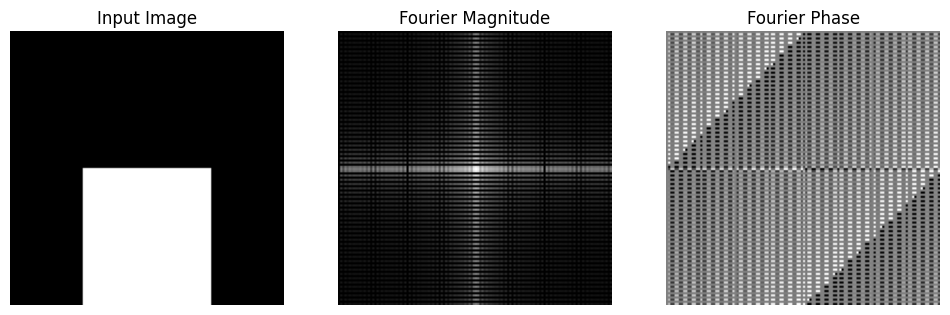

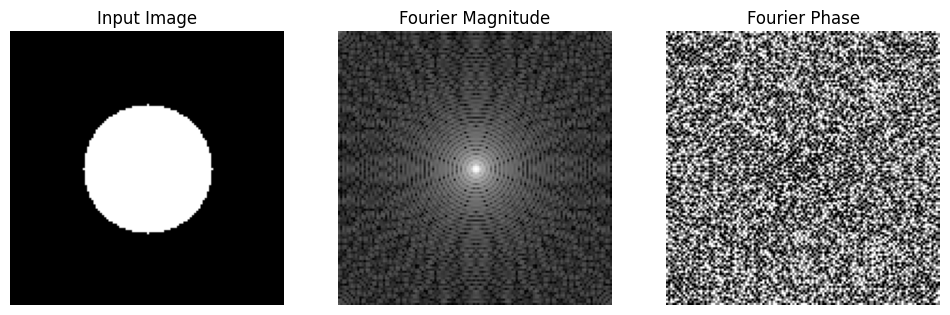

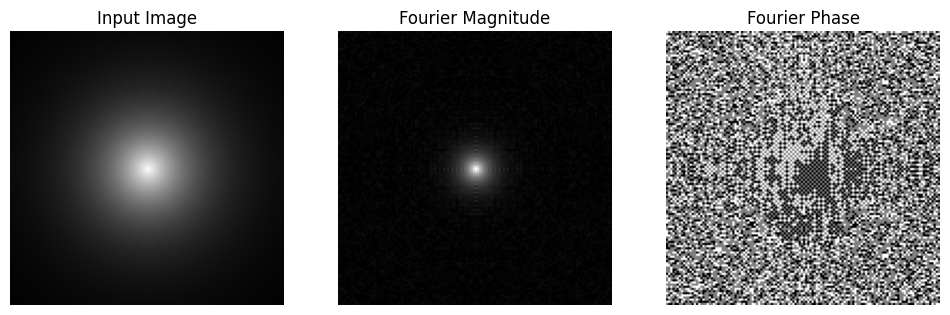

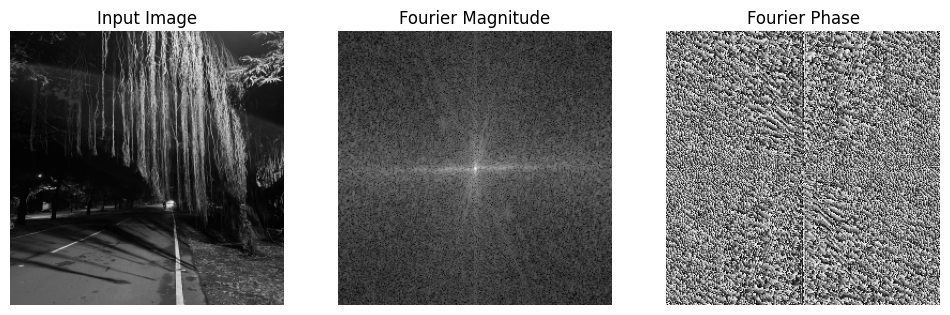

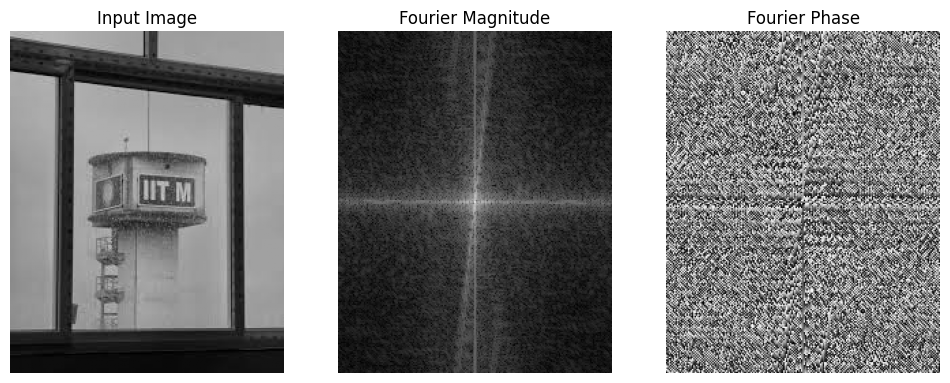

In [27]:
imag1 = load_gray_image("rectangular_box.png")
imag2 = load_gray_image("circular_disk.png")
imag3 = load_gray_image("exponential_decay.png")
imag4 = load_gray_image("IMG_5171.jpg",target_size=(256,256))
imag5 = load_gray_image("rain_iitm.jpeg")
plot_fourier(imag1)    
plot_fourier(imag2)    
plot_fourier(imag3)    
plot_fourier(imag4)    
plot_fourier(imag5)    
# Obersvations about frequency content





#### 3. Frequency-Domain High-Pass Filtering

Original shape: (256, 256)


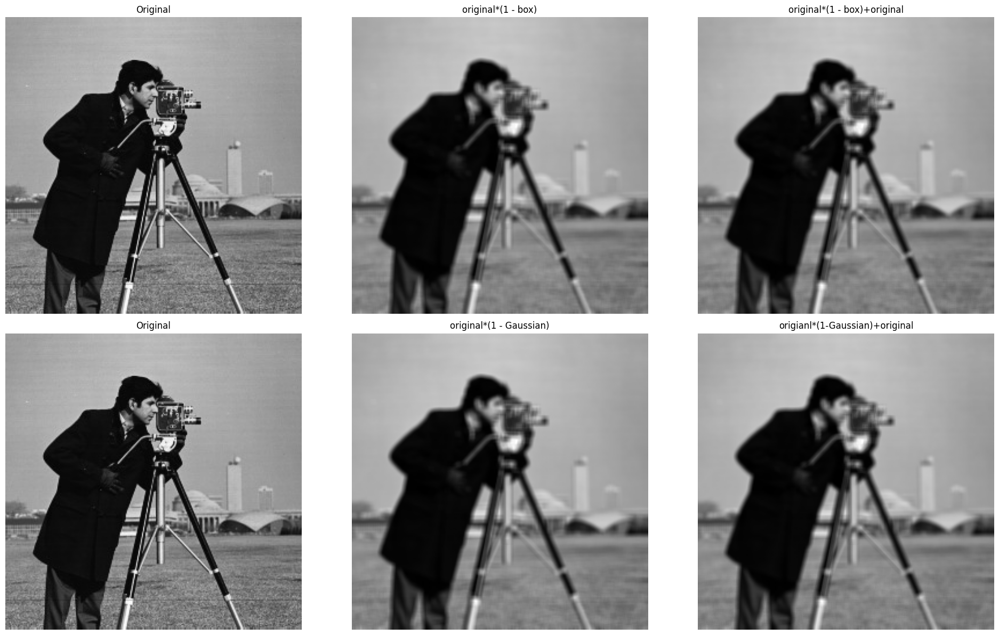

In [28]:
high_pass_with_gaussian = 1 - gauss_kernel
high_pass_with_box = 1 - box_kernel 
image = load_gray_image("cameraman.jpeg")
plt.figure(figsize=(20,12))
plt.subplot(2,3,1);plt.imshow(image, cmap = "gray"); plt.axis("off"); plt.title("Original")
plt.subplot(2,3,2);plt.imshow(convolve(image,high_pass_with_box,mode='reflect'), cmap = "gray"); plt.axis("off"); plt.title("original*(1 - box)")
plt.subplot(2,3,3);plt.imshow(image+convolve(image,high_pass_with_box,mode='reflect'), cmap = "gray"); plt.axis("off"); plt.title("original*(1 - box)+original")
plt.subplot(2,3,4);plt.imshow(image, cmap = "gray"); plt.axis("off"); plt.title("Original")
plt.subplot(2,3,5);plt.imshow(convolve(image,high_pass_with_gaussian,mode='reflect'), cmap = "gray"); plt.axis("off");plt.title("original*(1 - Gaussian)")
plt.subplot(2,3,6);plt.imshow(image+convolve(image,high_pass_with_gaussian,mode='reflect'), cmap = "gray"); plt.axis("off"); plt.title("origianl*(1-Gaussian)+original")
plt.tight_layout(); plt.show()

### Compute histogram

Original shape: (375, 500)
Max pixel difference between manual and OpenCV: 1


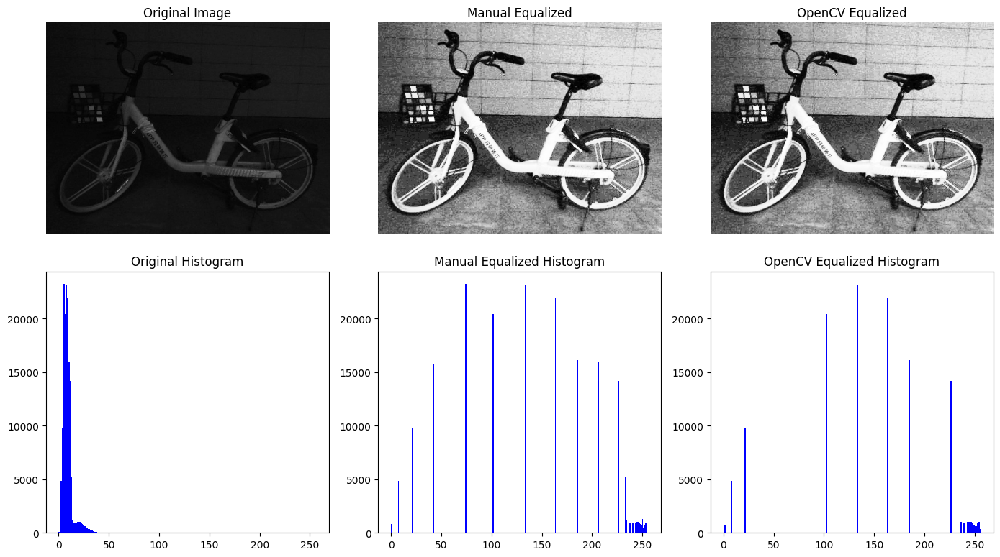

In [29]:
img = load_gray_image("ll.JPG")

def hist_eq(img):
  # If img is already normalized float32 [0,1], convert it back to uint8 [0,255]
  if img.dtype == np.float32 or img.dtype == np.float64:
      if img.max() <= 1.0:   # assume normalized
          img_uint8 = (img * 255).astype(np.uint8)
      else:
          img_uint8 = img.astype(np.uint8)
  else:
      img_uint8 = img

  # -------- Manual Histogram Equalization --------
  # Step 1: Histogram
  hist, bins = np.histogram(img_uint8.flatten(), 256, [0,256])

  # Step 2: CDF
  cdf = hist.cumsum()

  # Step 3: Normalize CDF
  cdf_min = cdf[cdf > 0].min()
  cdf_max = cdf.max()
  cdf_scaled = (cdf - cdf_min) * 255 / (cdf_max - cdf_min)
  cdf_scaled = cdf_scaled.astype(np.uint8)

  # Step 4: Apply mapping
  manual_eq = cdf_scaled[img_uint8]

  # -------- OpenCV Histogram Equalization --------
  opencv_eq = cv2.equalizeHist(img_uint8)

  # -------- Difference Check --------
  diff = np.abs(manual_eq.astype(int) - opencv_eq.astype(int))
  print("Max pixel difference between manual and OpenCV:", diff.max())

  return img_uint8, manual_eq, opencv_eq

img_uint8, manual_eq, opencv_eq = hist_eq(img)

# -------- Plot Results --------
plt.figure(figsize=(14,8))

plt.subplot(2,3,1)
plt.title("Original Image")
plt.imshow(img_uint8, cmap="gray")
plt.axis("off")

plt.subplot(2,3,2)
plt.title("Manual Equalized")
plt.imshow(manual_eq, cmap="gray")
plt.axis("off")

plt.subplot(2,3,3)
plt.title("OpenCV Equalized")
plt.imshow(opencv_eq, cmap="gray")
plt.axis("off")

plt.subplot(2,3,4)
plt.title("Original Histogram")
plt.hist(img_uint8.flatten(), 256, range=[0,256], color='blue')


plt.subplot(2,3,5)
plt.title("Manual Equalized Histogram")
plt.hist(manual_eq.flatten(), 256, range=[0,256], color='blue')


plt.subplot(2,3,6)
plt.title("OpenCV Equalized Histogram")
plt.hist(opencv_eq.flatten(), 256, range=[0,256], color='blue')


plt.tight_layout()
plt.show()


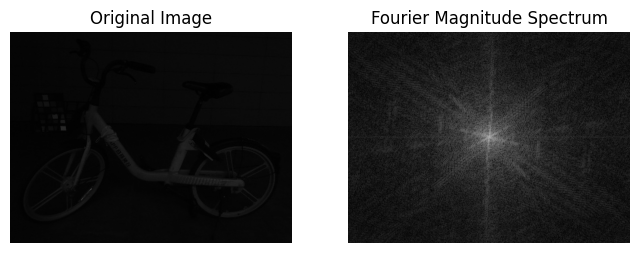

In [30]:
save_and_plot_fft(img, "low_light", "low_light_spectrum")

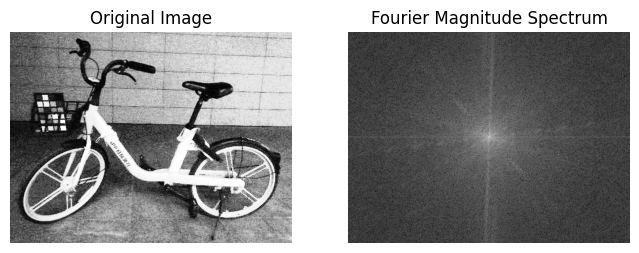

In [31]:
equalized_img = opencv_eq.astype(np.float32) / 255.0
save_and_plot_fft(equalized_img, "low_light_eq", "low_light_eq_spec")

#### Exercise

##### Histogram Equalization

- Take a **hazy image**:
  - Read the image as an RGB image.  
  - Apply **histogram equalization** (compare results on each channel separately vs. on the luminance channel after converting to YCrCb/HSV).  

- Take an **image**:
  - Brighten the image by multiplying with a factor of (0.5 and 2)
  - Read them as RGB image.  
  - Apply histogram equalization on all 3 images (original, darkened and brightened) and observe how the contrast changes.  

- Compare results:
  - Before vs. after equalization  
  - Differences between per-channel equalization and luminance-channel equalization  
  - Comment on whether the image looks **natural** or has **color distortions**.  


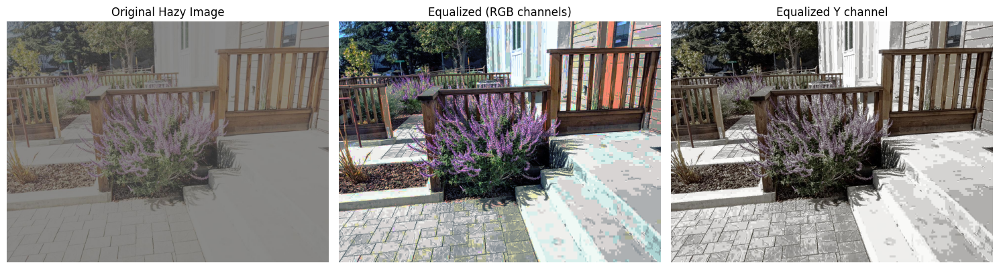

In [80]:
hazy_bgr = cv2.imread("haze.png")
hazy_rgb = cv2.cvtColor(hazy_bgr, cv2.COLOR_BGR2RGB)

r, g, b = cv2.split(hazy_rgb)
r_eq = cv2.equalizeHist(r)
g_eq = cv2.equalizeHist(g)
b_eq = cv2.equalizeHist(b)
rgb_eq = cv2.merge([r_eq, g_eq, b_eq])

hazy_ycrcb = cv2.cvtColor(hazy_bgr, cv2.COLOR_BGR2YCrCb)
Y, Cr, Cb = cv2.split(hazy_ycrcb)

Y_eq = cv2.equalizeHist(Y) 
ycrcb_eq = cv2.merge([Y_eq, Cr, Cb])
y_eq_rgb = cv2.cvtColor(ycrcb_eq, cv2.COLOR_YCrCb2RGB)


plt.figure(figsize=(15,8))

plt.subplot(1,3,1); plt.imshow(hazy_rgb); plt.title("Original Hazy Image"); plt.axis("off")
plt.subplot(1,3,2); plt.imshow(rgb_eq); plt.title("Equalized (RGB channels)"); plt.axis("off")
plt.subplot(1,3,3); plt.imshow(y_eq_rgb); plt.title("Equalized Y channel"); plt.axis("off")
plt.tight_layout(); plt.show()

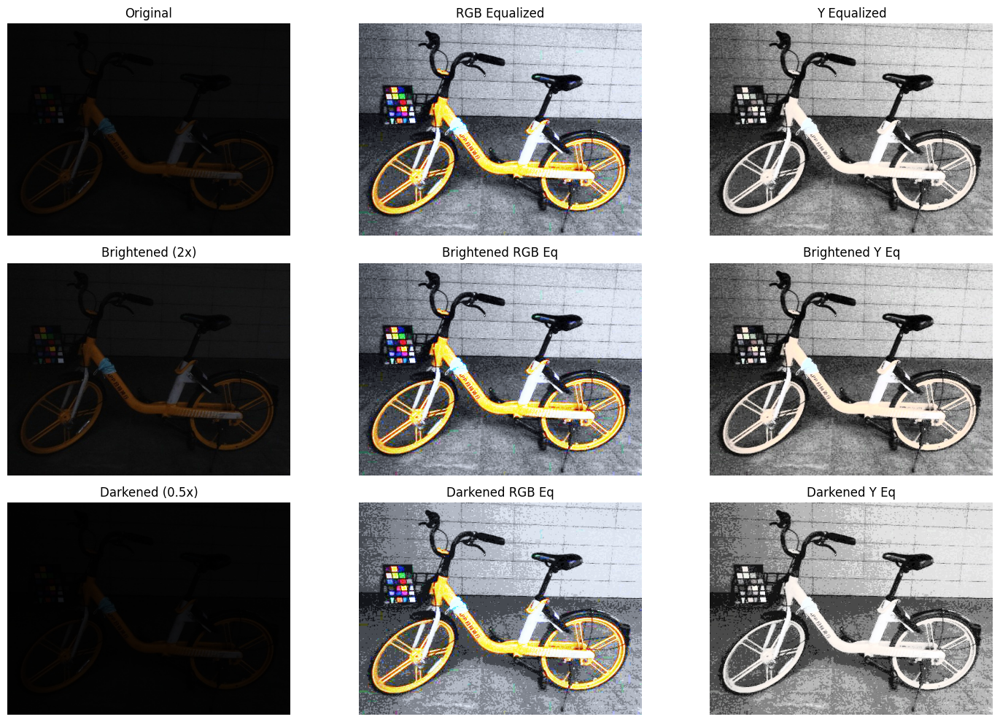

In [82]:
def equalize_rgb(img_rgb):
    r, g, b = cv2.split(img_rgb)
    r_eq = cv2.equalizeHist(r)
    g_eq = cv2.equalizeHist(g)
    b_eq = cv2.equalizeHist(b)
    return cv2.merge([r_eq, g_eq, b_eq])

def equalize_luminance(img_rgb):
    img_ycrcb = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2YCrCb)
    Y, Cr, Cb = cv2.split(img_ycrcb)
    Y_eq = cv2.equalizeHist(Y)
    img_ycrcb_eq = cv2.merge([Y_eq, Cr, Cb])
    return cv2.cvtColor(img_ycrcb_eq, cv2.COLOR_YCrCb2RGB)

image_bgr = cv2.imread("ll.JPG")
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

image_rgb_brighten = np.clip(2 * image_rgb, 0, 255).astype(np.uint8)
image_rgb_darken = np.clip(0.5 * image_rgb, 0, 255).astype(np.uint8)

image_rgb_eq = equalize_rgb(image_rgb)
image_rgb_brighten_eq = equalize_rgb(image_rgb_brighten)
image_rgb_darken_eq = equalize_rgb(image_rgb_darken)

image_y_eq = equalize_luminance(image_rgb)
image_y_brighten_eq = equalize_luminance(image_rgb_brighten)
image_y_darken_eq = equalize_luminance(image_rgb_darken)


plt.figure(figsize=(15,10))

# Original + Per-channel vs. Luminance
plt.subplot(3,3,1); plt.imshow(image_rgb); plt.title("Original"); plt.axis("off")
plt.subplot(3,3,2); plt.imshow(image_rgb_eq); plt.title("RGB Equalized"); plt.axis("off")
plt.subplot(3,3,3); plt.imshow(image_y_eq); plt.title("Y Equalized"); plt.axis("off")
# Brightened
plt.subplot(3,3,4); plt.imshow(image_rgb_brighten); plt.title("Brightened (2x)"); plt.axis("off")
plt.subplot(3,3,5); plt.imshow(image_rgb_brighten_eq); plt.title("Brightened RGB Eq"); plt.axis("off")
plt.subplot(3,3,6); plt.imshow(image_y_brighten_eq); plt.title("Brightened Y Eq"); plt.axis("off")
# Darkened
plt.subplot(3,3,7); plt.imshow(image_rgb_darken); plt.title("Darkened (0.5x)"); plt.axis("off")
plt.subplot(3,3,8); plt.imshow(image_rgb_darken_eq); plt.title("Darkened RGB Eq"); plt.axis("off")
plt.subplot(3,3,9); plt.imshow(image_y_darken_eq); plt.title("Darkened Y Eq"); plt.axis("off")
plt.tight_layout()
plt.show()